# Pix2Pix Evaluation
*This notebook was run by Arsyi Syarief Aziz (H071191003), Muh. Yusuf Syam, and Aso Ahmad Amin Rais for the Introduction to Deep Learning course (Unhas) taught by Dr. Risman Adnan.*

-------

This notebook is used to evaluate the Pix2Pix model that we trained in the Pix2Pix notebook on three datasets, namely facades, maps, and edges2shoes.

## 1. Importing libraries

In [1]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

import numpy as np

## Loading dataset

In [2]:
dataset_name = "edges2shoes"

In [3]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

2165293056/2165283376 [==============================] - 951s 0us/step


In [4]:
def load(image_file):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # Split each image tensor into two tensors:
    # - one with a real building facade image
    # - one with an architecture label image 
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, w:, :]
    real_image = image[:, :w, :]

    # Convert both images to float32 tensors
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

In [5]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [6]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [7]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

In [8]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [9]:
@tf.function()
def random_jitter(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
    # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

In [10]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [11]:
try:
    test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Defining Generator

In [12]:
OUTPUT_CHANNELS = 3

In [13]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [14]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [15]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [16]:
generator = Generator()

## Defining Discriminator

In [17]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [18]:
discriminator = Discriminator()

## Defining Optimizers and Check-Point Saver

In [19]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [20]:
checkpoint_dir = f'./checkpoints/{dataset_name}/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Loading Checkpoint

In [21]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [22]:
new_checkpoint_dir= f'/content/gdrive/MyDrive/deep_learning/{dataset_name}/training_checkpoints/ckpt-1'

In [23]:
checkpoint.restore(new_checkpoint_dir)

In [24]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [26]:
# Run the trained model on a few examples from the test set
num_samples = 50
sample_split = int(num_samples / 2)
indicies = np.arange(num_samples)
np.random.shuffle(indicies) 
real_indicies = indicies[:sample_split]

stats = {'real': 0, 'fake': 0}

saved_results = []
samples = test_dataset.take(num_samples)
for i, (tar, inp) in enumerate(samples):
    display.clear_output(wait=True)
    print(f"Image {i+1}/{num_samples}")
    
    if i in real_indicies:
        plt.imshow(tar[0] * 0.5 + 0.5)
    else:
        prediction = generator(inp, training=True)
        plt.imshow(prediction[0] * 0.5 + 0.5)
    plt.show()
        
    guess = input('real (r) or fake (f)?')
    if i in real_indicies and guess == 'r':
        stats['real'] += 1
        res = 'correct'
    elif i not in real_indicies and guess == 'f':
        stats['fake'] += 1
        res = 'correct'
    else:
        res = 'incorrect'
    
    if i in real_indicies:
        saved_results.append((inp, tar, 'real', res))
    else:
        saved_results.append((inp, tar, 'fake', res))

display.clear_output(wait=True)
print("Test complete!")
print(f"Correctly guessed {stats['real']}/{sample_split} of real samples and {stats['fake']}/{num_samples-sample_split} of fake samples")

Test complete!
Correctly guessed 18/25 of real samples and 15/25 of fake samples


Image 1: Test Type: real image; Result: correct prediction


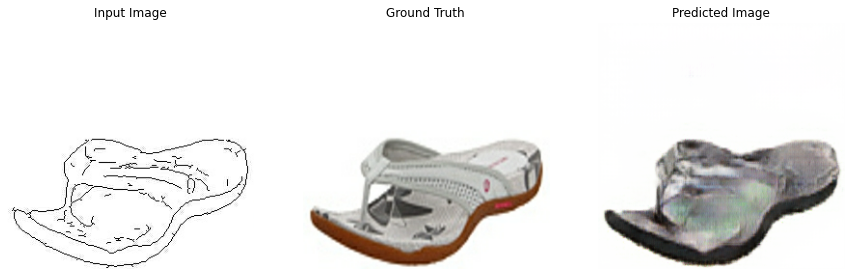

Image 2: Test Type: real image; Result: correct prediction


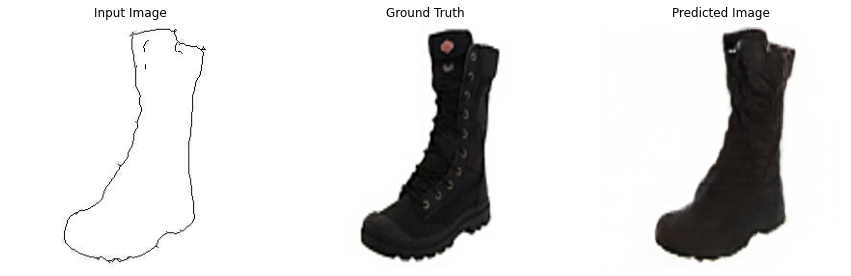

Image 3: Test Type: fake image; Result: correct prediction


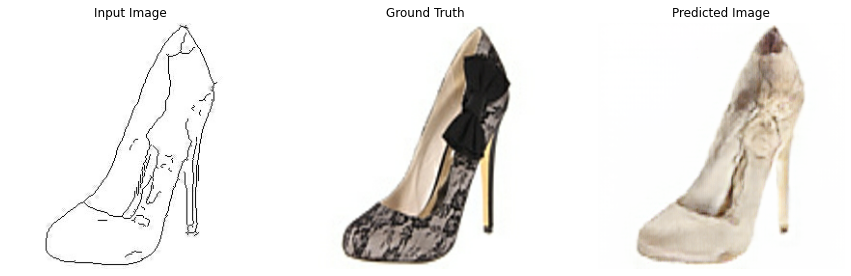

Image 4: Test Type: real image; Result: correct prediction


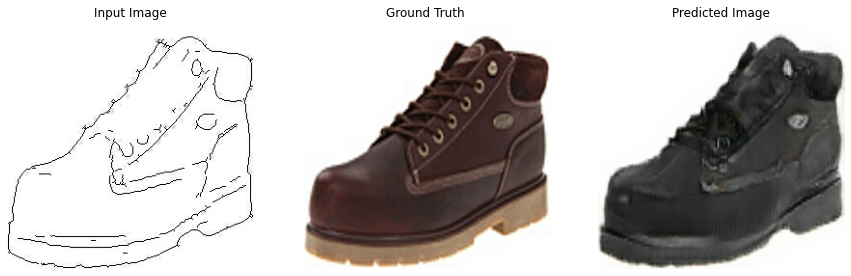

Image 5: Test Type: real image; Result: incorrect prediction


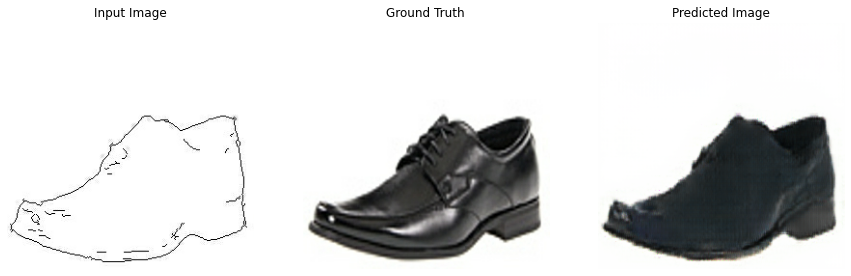

Image 6: Test Type: real image; Result: correct prediction


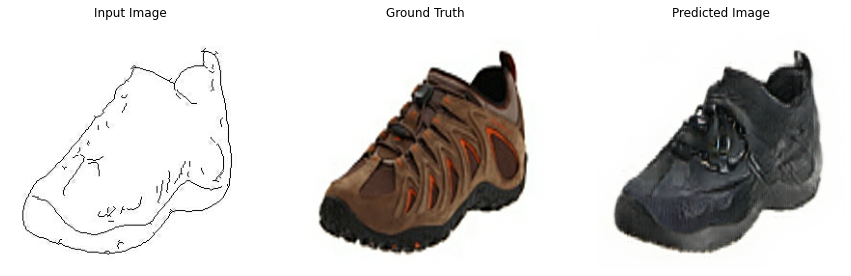

Image 7: Test Type: fake image; Result: correct prediction


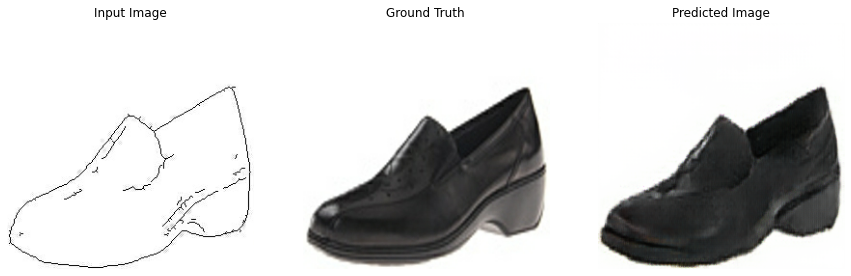

Image 8: Test Type: fake image; Result: incorrect prediction


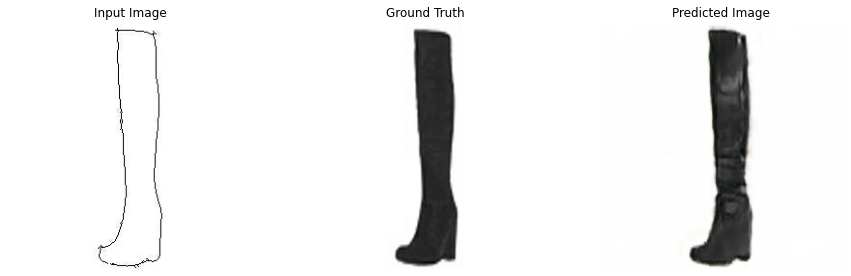

Image 9: Test Type: fake image; Result: incorrect prediction


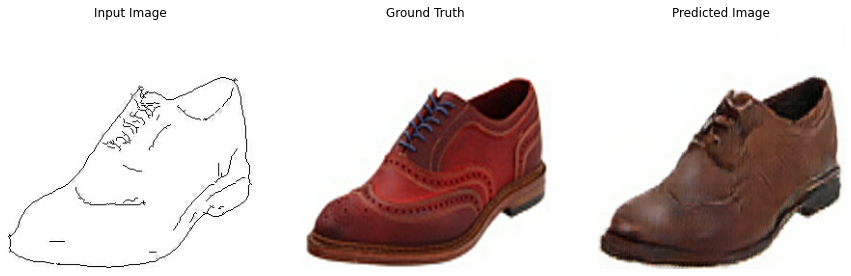

Image 10: Test Type: fake image; Result: correct prediction


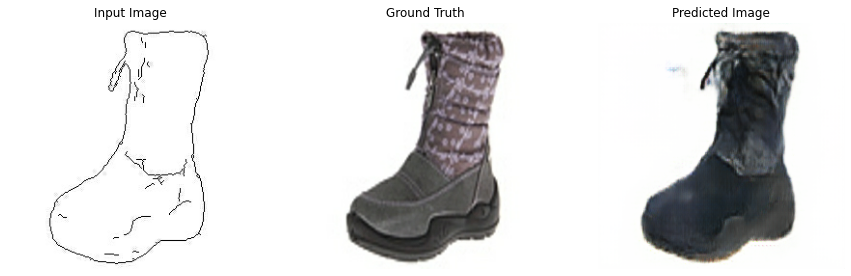

Image 11: Test Type: real image; Result: incorrect prediction


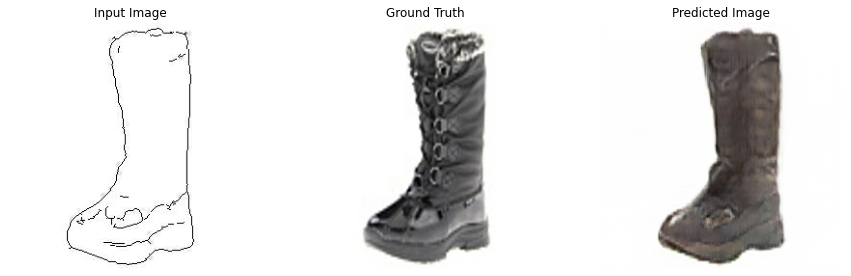

Image 12: Test Type: fake image; Result: incorrect prediction


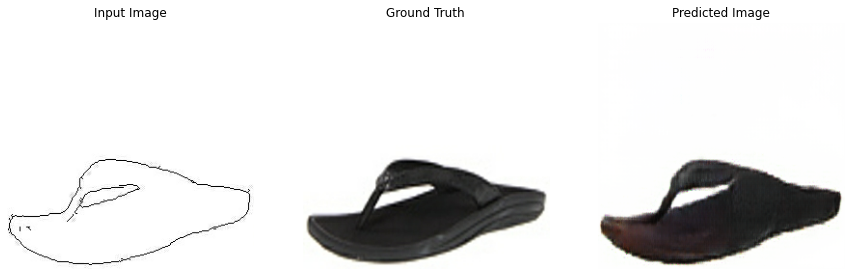

Image 13: Test Type: real image; Result: correct prediction


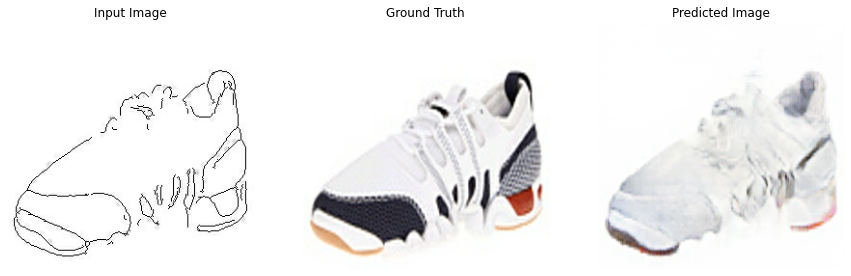

Image 14: Test Type: fake image; Result: correct prediction


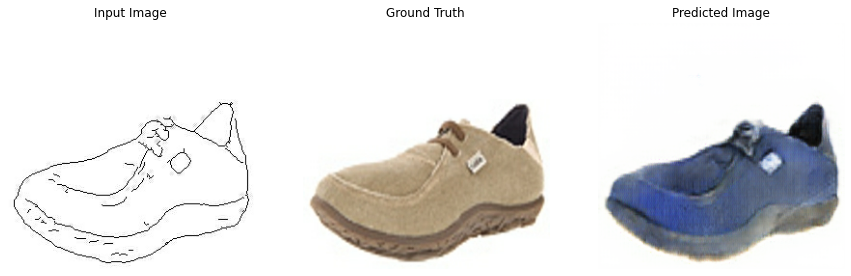

Image 15: Test Type: real image; Result: incorrect prediction


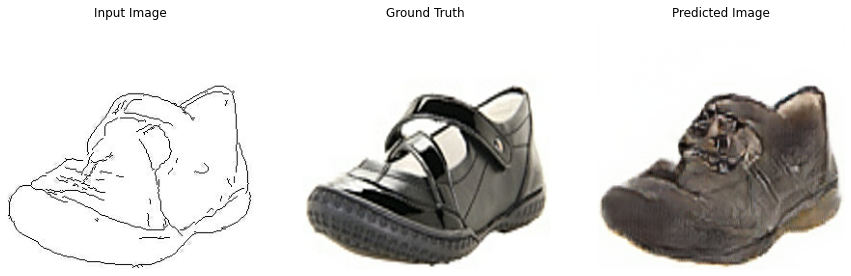

Image 16: Test Type: fake image; Result: correct prediction


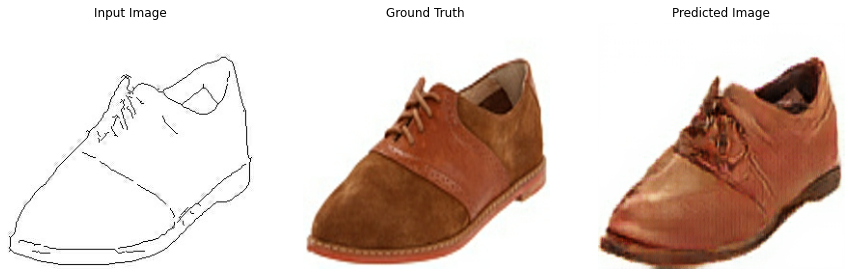

Image 17: Test Type: real image; Result: correct prediction


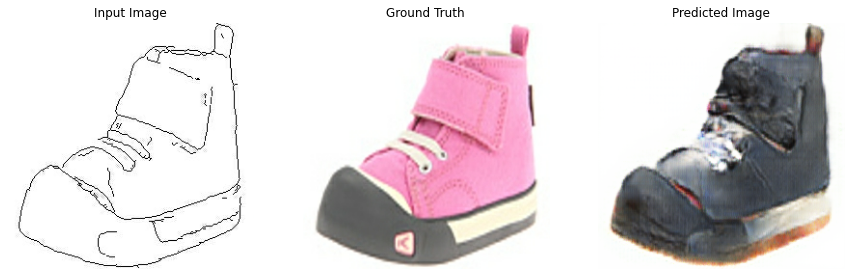

Image 18: Test Type: fake image; Result: correct prediction


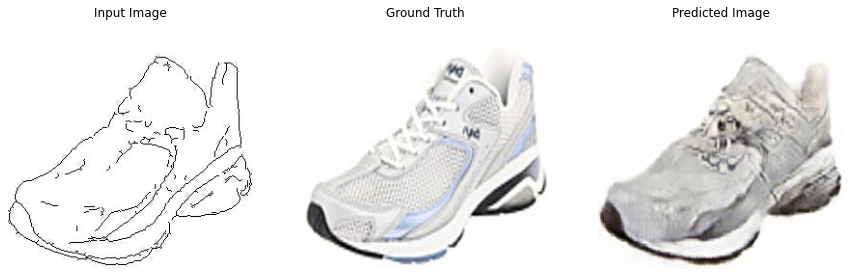

Image 19: Test Type: real image; Result: correct prediction


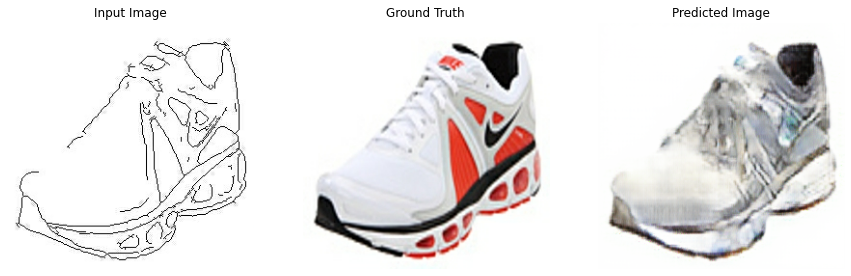

Image 20: Test Type: real image; Result: incorrect prediction


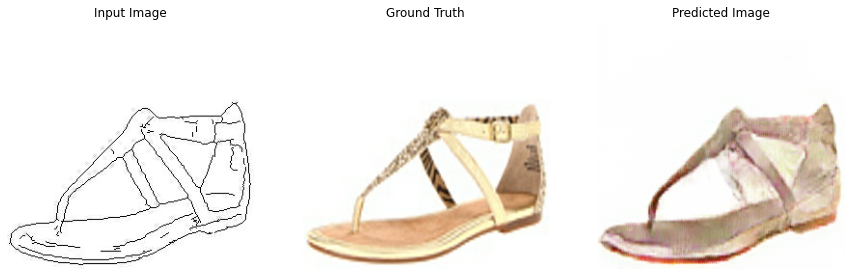

Image 21: Test Type: real image; Result: correct prediction


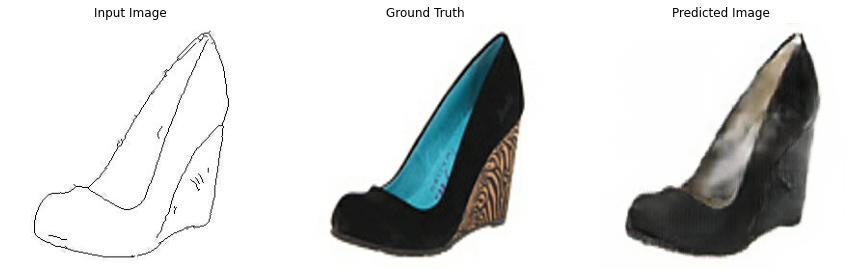

Image 22: Test Type: real image; Result: correct prediction


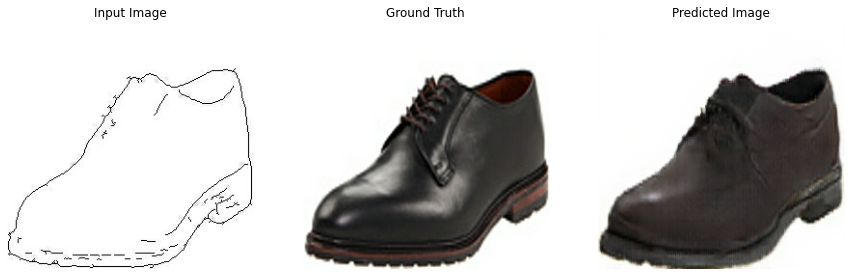

Image 23: Test Type: real image; Result: correct prediction


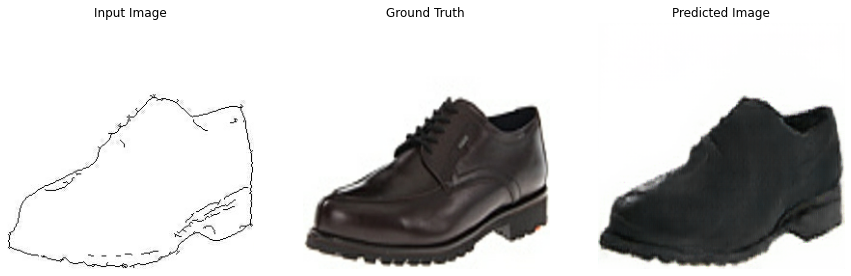

Image 24: Test Type: fake image; Result: correct prediction


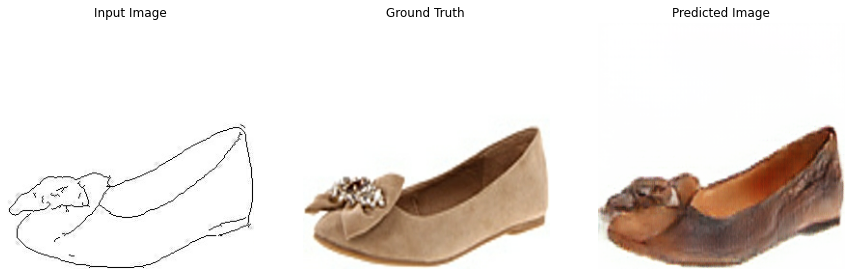

Image 25: Test Type: fake image; Result: correct prediction


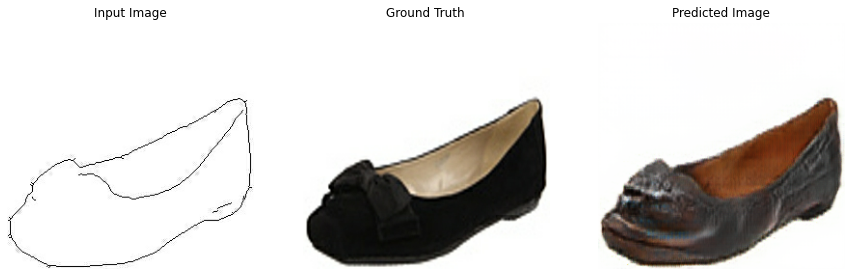

Image 26: Test Type: fake image; Result: incorrect prediction


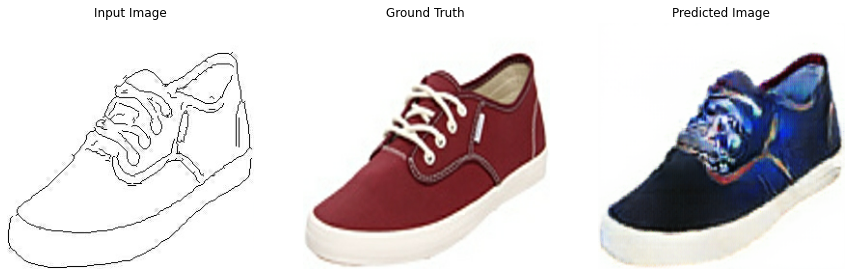

Image 27: Test Type: fake image; Result: incorrect prediction


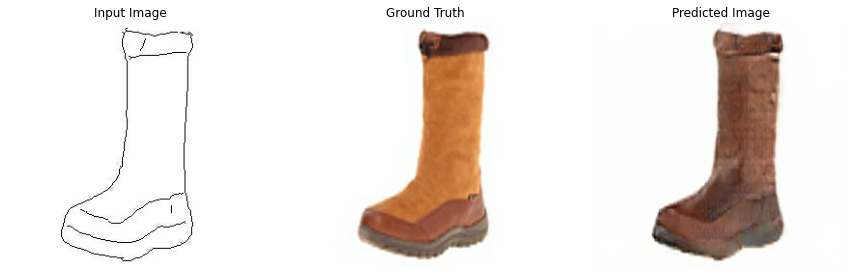

Image 28: Test Type: real image; Result: incorrect prediction


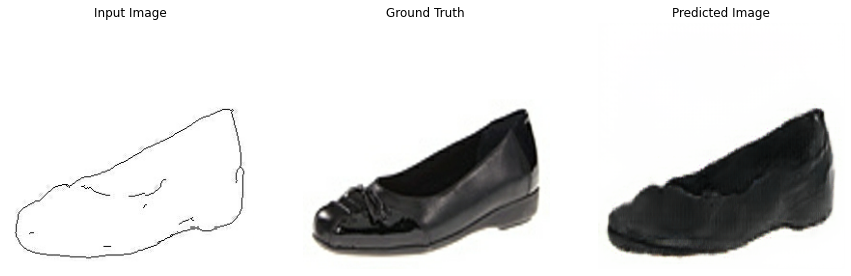

Image 29: Test Type: real image; Result: incorrect prediction


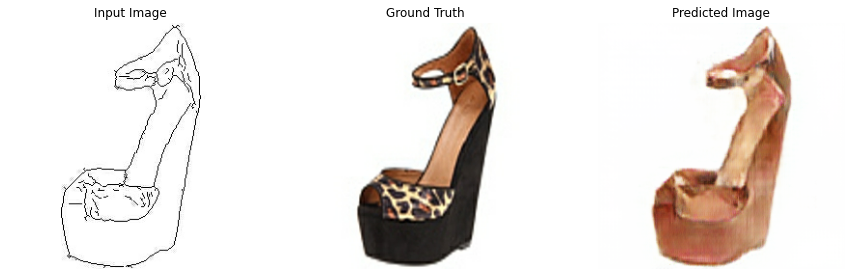

Image 30: Test Type: fake image; Result: incorrect prediction


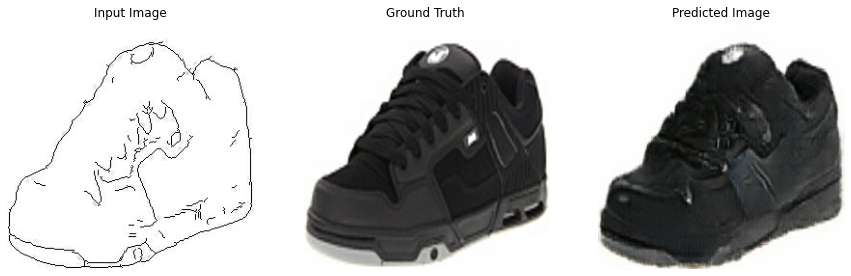

Image 31: Test Type: real image; Result: correct prediction


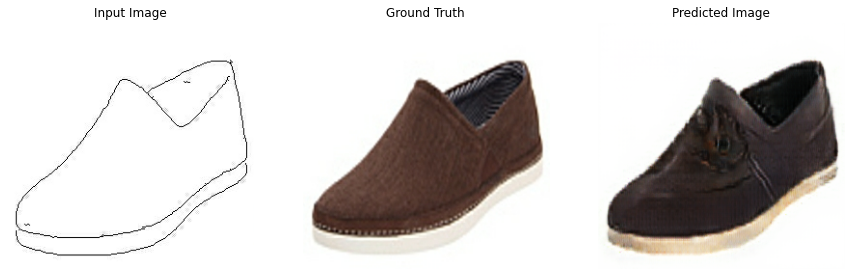

Image 32: Test Type: fake image; Result: correct prediction


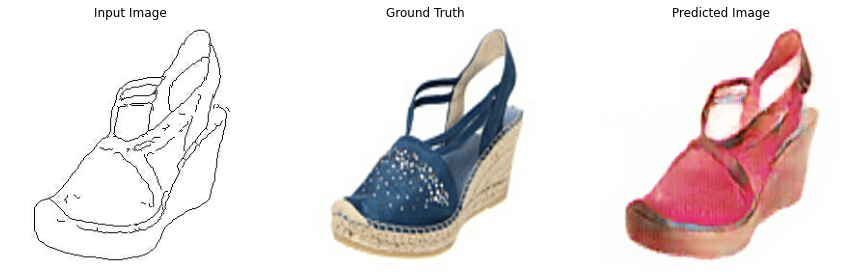

Image 33: Test Type: fake image; Result: incorrect prediction


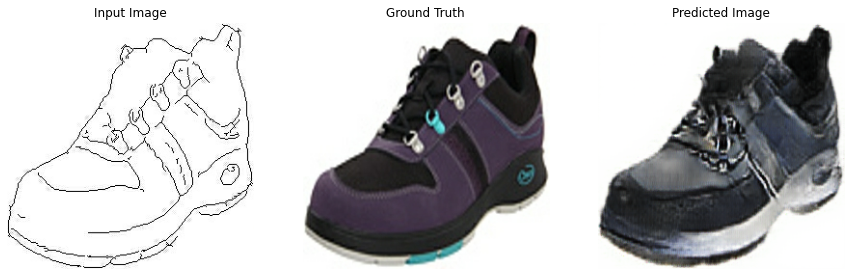

Image 34: Test Type: fake image; Result: correct prediction


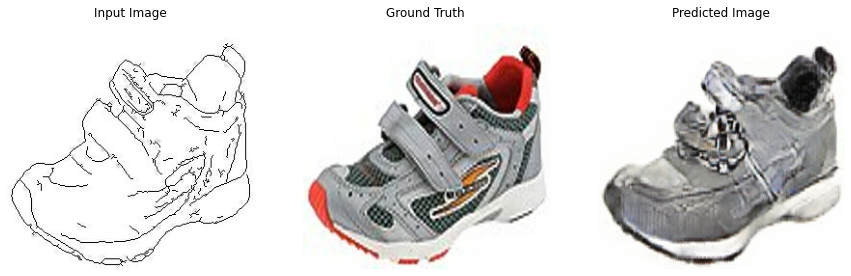

Image 35: Test Type: fake image; Result: correct prediction


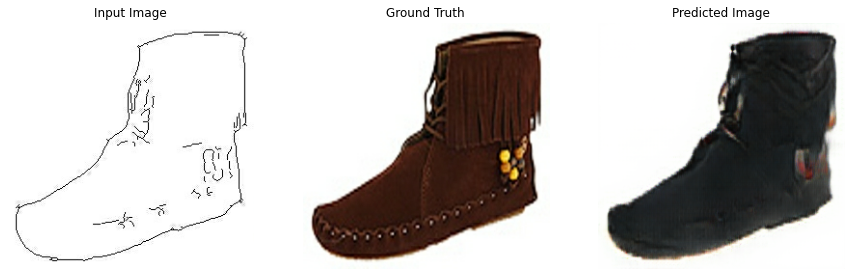

Image 36: Test Type: real image; Result: correct prediction


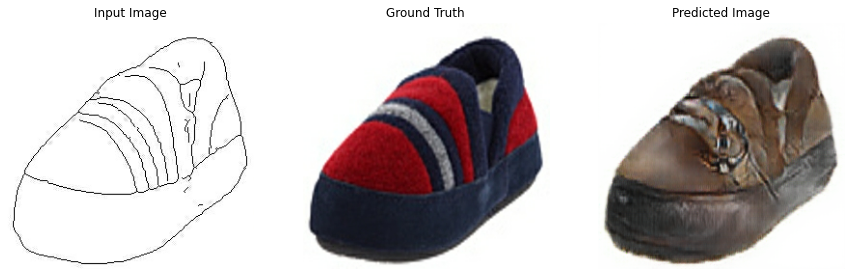

Image 37: Test Type: real image; Result: incorrect prediction


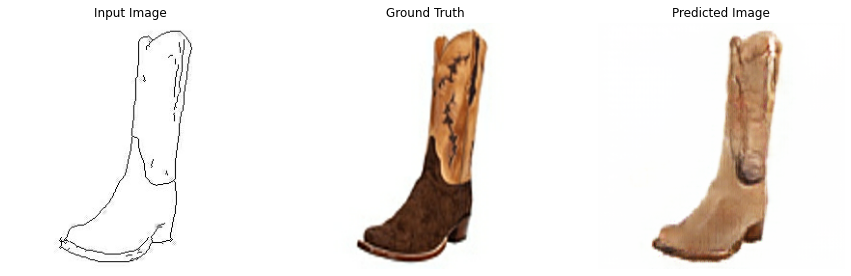

Image 38: Test Type: real image; Result: correct prediction


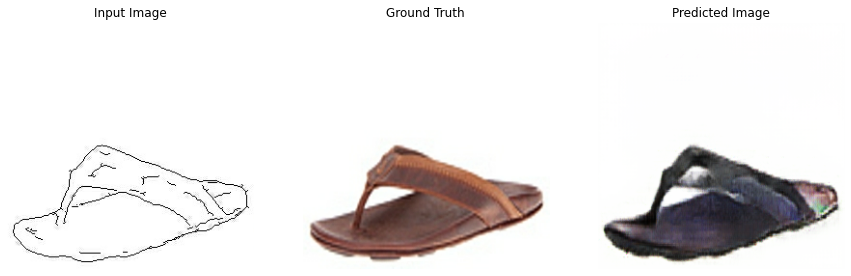

Image 39: Test Type: real image; Result: correct prediction


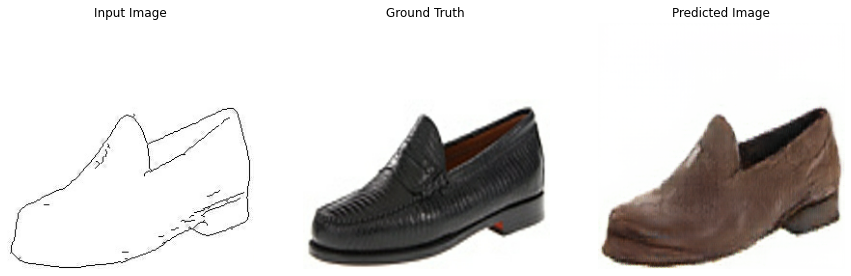

Image 40: Test Type: fake image; Result: correct prediction


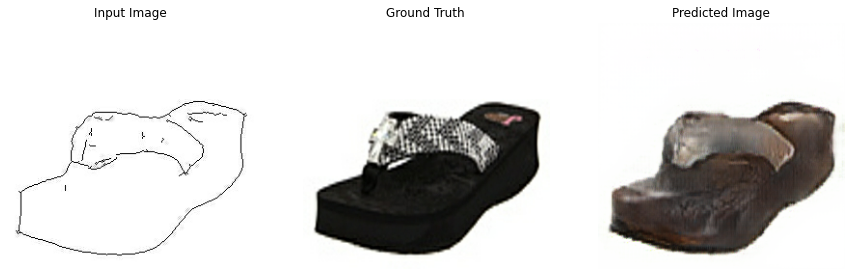

Image 41: Test Type: fake image; Result: correct prediction


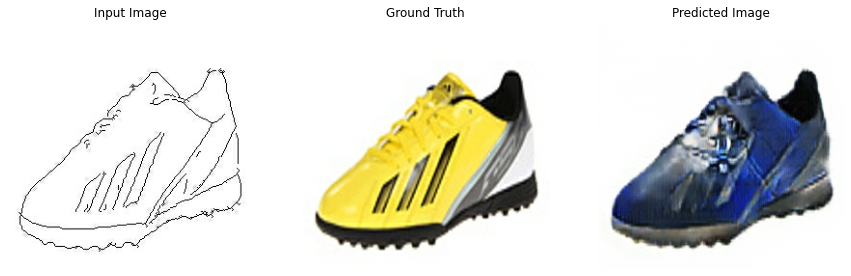

Image 42: Test Type: real image; Result: correct prediction


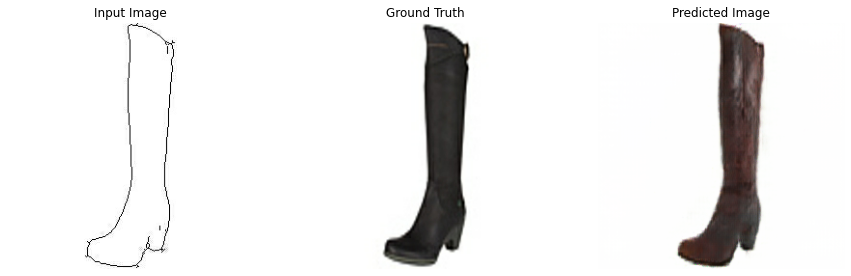

Image 43: Test Type: fake image; Result: incorrect prediction


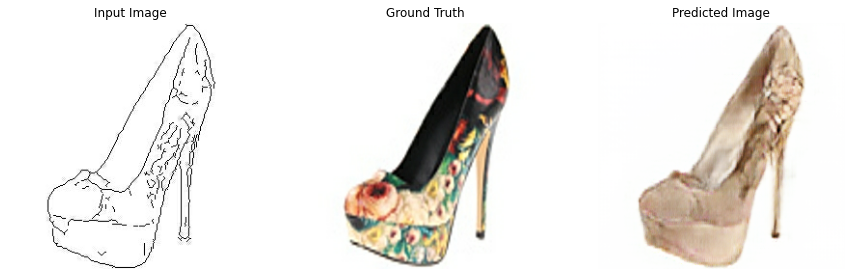

Image 44: Test Type: fake image; Result: correct prediction


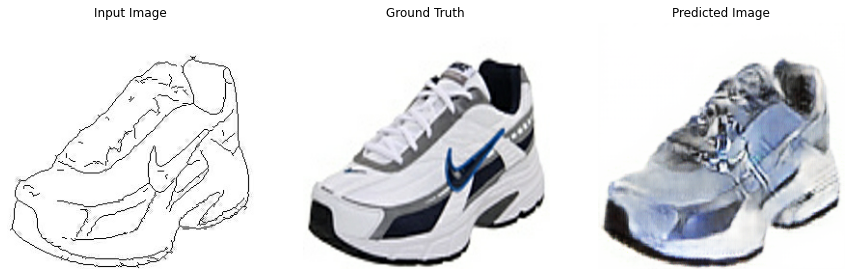

Image 45: Test Type: fake image; Result: incorrect prediction


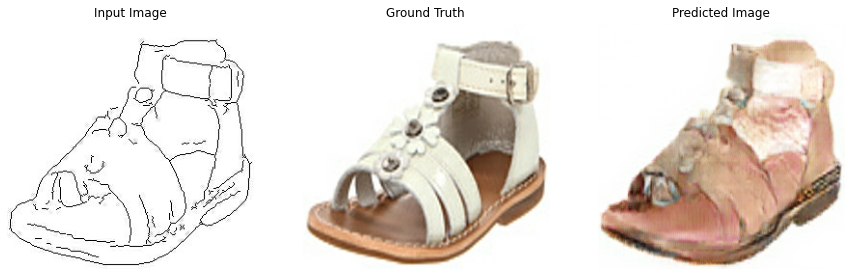

Image 46: Test Type: real image; Result: correct prediction


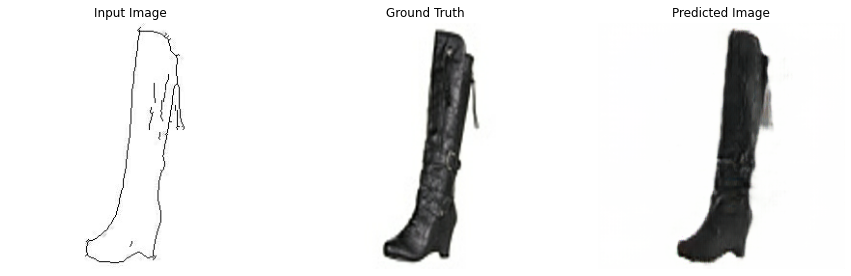

Image 47: Test Type: fake image; Result: correct prediction


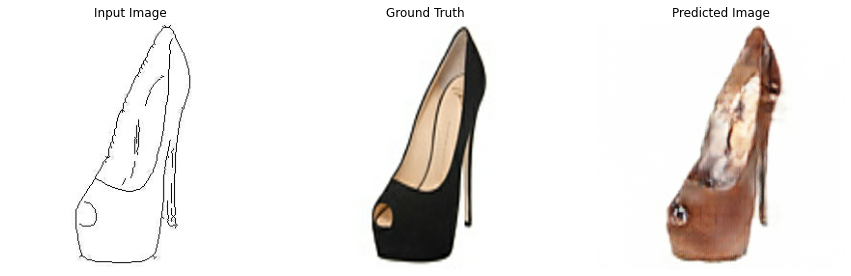

Image 48: Test Type: fake image; Result: incorrect prediction


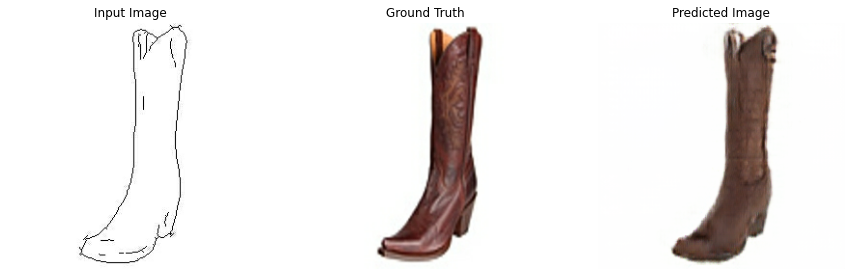

Image 49: Test Type: real image; Result: correct prediction


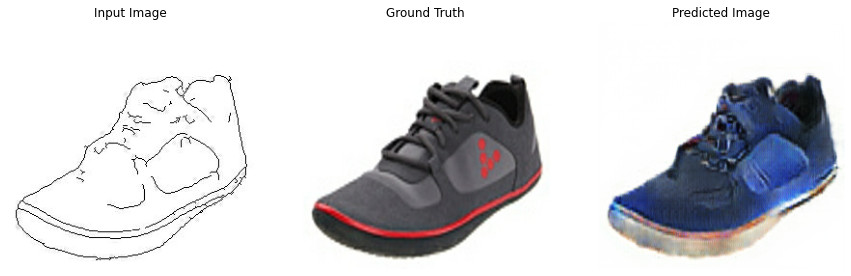

Image 50: Test Type: real image; Result: correct prediction


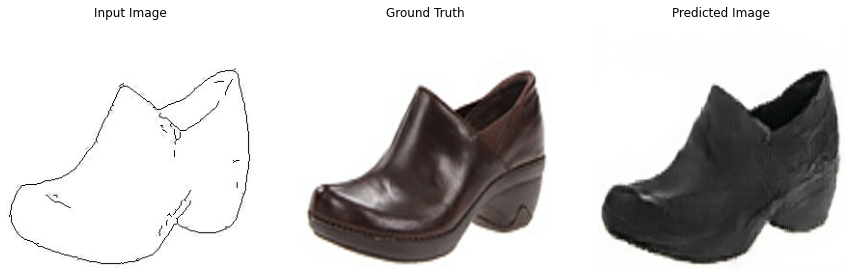

In [27]:
for i, (inp, tar, test_type, res) in enumerate(saved_results):
    print(f"Image {i+1}: Test Type: {test_type} image; Result: {res} prediction")
    generate_images(generator, inp, tar)